In [1]:
import numpy as np
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

In [2]:
path = "/Users/eliasstrauss/PycharmProjects/Sentinel_Building_Segmentation/"

In [3]:
path = "/Users/eliasstrauss/PycharmProjects/Sentinel_Building_Segmentation/"
test_images = np.load('data/tensors/test_set_Berlin_sentinel.npy')
test_labels = np.load('data/tensors/test_set_Berlin_building.npy')
assert test_images.shape[:2] == test_labels.shape[:2]
share_of_buildings_test = np.sum(test_labels) / test_labels.size
share_of_buildings_test

np.float64(0.20788127778175391)

In [4]:
nr_samples = "_custom"
labels = np.load("data/tensors/building_segmentation_labels_dataset_equal_provenance{}.npy".format(nr_samples))
images = np.load("data/tensors/building_segmentation_images_dataset_equal_provenance{}.npy".format(nr_samples))
share_of_buildings = np.sum(labels) / labels.size
share_of_buildings, labels.shape[0]

(np.float64(0.20271414620535713), 1050)

In [5]:
images.shape, test_images.shape

((1050, 128, 128, 4), (1361, 1427, 4))

In [6]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)
print("train: {} vs. test: {}".format(np.sum(y_train) / y_train.size, np.sum(y_test) / y_test.size,))

tensor_x_train = torch.Tensor(X_train) # transform to torch tensor
tensor_y_train = torch.Tensor(y_train)
tensor_x_test = torch.Tensor(X_test)
tensor_y_test = torch.Tensor(y_test)

train: 0.20441196986607144 vs. test: 0.1959228515625


In [7]:
del images, labels, X_train, X_test, y_train, y_test
tensor_x_train.shape, tensor_y_train.shape, tensor_x_test.shape, tensor_y_test.shape

(torch.Size([840, 128, 128, 4]),
 torch.Size([840, 128, 128]),
 torch.Size([210, 128, 128, 4]),
 torch.Size([210, 128, 128]))

In [8]:
def eval_accuracy(predictions, truth):
    correct_total = (predictions == truth).sum().item() / (truth.size(0) * truth.size(1)*truth.size(2))
    correct_buildings = torch.logical_and((predictions == truth), truth).sum().item() / truth.sum().item()
    correct_land = torch.logical_and((predictions == truth), ~truth).sum().item() / (~truth).sum().item()
    errors = (predictions != truth)
    return errors, (correct_total, correct_buildings, correct_land)

In [9]:
def load_dataset(num_samples):
    labels_ = np.load(path + "data/tensors/building_segmentation_labels_dataset_equal_provenance{}.npy".format(num_samples))
    images_ = np.load(path + "data/tensors/building_segmentation_images_dataset_equal_provenance{}.npy".format(num_samples))
    X_train_, X_test_, y_train_, y_test_ = train_test_split(images_, labels_, test_size=0.2, random_state=42)
    del images_, labels_
    tensor_x_train_ = torch.Tensor(X_train_) # transform to torch tensor
    tensor_y_train_ = torch.Tensor(y_train_)
    tensor_x_test_ = torch.Tensor(X_test_)
    tensor_y_test_ = torch.Tensor(y_test_)
    del X_train_, X_test_, y_train_, y_test_
    train_dataset = TensorDataset(tensor_x_train_, tensor_y_train_)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    test_dataset = TensorDataset(tensor_x_test_, tensor_y_test_)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)
    return train_loader, test_loader

In [10]:
import torch.nn as nn
def get_model():
    C = 4
    model = nn.Sequential(
    nn.Conv2d(C, 32, kernel_size=3, padding=1), nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(),
    nn.Conv2d(64, 128, kernel_size=3, padding=1), nn.ReLU(),
    nn.Conv2d(128, 1, kernel_size=1, padding=0))
    criterion = nn.BCEWithLogitsLoss()
    return model, criterion

In [11]:
mps_device = torch.device("mps")

In [17]:
def train_model(model_to_train, loss_fn, optimizer, train_load):
    model_to_train.train()
    running_loss = 0.0

    for batch, batch_labels in train_load:
        optimizer.zero_grad()
        batch = batch.to(mps_device)
        batch_labels = batch_labels.to(mps_device)
        model_out = model_to_train(batch.permute(0, 3, 1, 2))  # Change shape to (batch_size, channels, height, width)
        batch_labels = batch_labels.unsqueeze(1).float()
        loss = loss_fn(model_out, batch_labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * batch.size(0)
    
    epoch_loss = running_loss / len(train_load.dataset)
    return epoch_loss

In [18]:
def test_model(model_to_test, test_load):
    accs = []
    with torch.no_grad():
        for batch, batch_labels in test_load:
            batch = batch.to(mps_device)
            batch_labels = batch_labels.to(mps_device)
            model_out = model_to_test(batch.permute(0, 3, 1, 2))  # Change shape to (batch_size, channels, height, width)
            predicted_labels = (model_out > 0).squeeze(1)
            _, acc = eval_accuracy(predicted_labels, batch_labels.to(torch.bool))
            accs.append(acc)
    return np.array(accs).mean(0)

In [15]:
import torch.optim as optim
from ray import train, tune


def objective(config):
    torch.manual_seed(2000)
    train_loader, test_loader = load_dataset("_custom")
    
    model, crit = get_model()
    optimizer = optim.Adam(model.parameters(), lr=config["lr"])
    while True:
        loss = train_model(model, crit, optimizer, train_loader)  # Train the model
        acc = test_model(model, test_loader)  # Compute test accuracy
        train.report({"mean_accuracy": acc[1]})  # Report to Tune

/Users/eliasstrauss/PycharmProjects/Sentinel_Building_Segmentation/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [37]:
from ray.tune.search import ConcurrencyLimiter
from ray.tune.search.basic_variant import BasicVariantGenerator
# Define the search space
search_space = {"lr": tune.grid_search([0.0003, 0.001, 0.003, 0.01])}

# Use BasicVariantGenerator for grid search
algo = BasicVariantGenerator()
#algo = ConcurrencyLimiter(algo, max_concurrent=1)

trainable_with_resources = tune.with_resources(objective, {"cpu": 8})
tuner = tune.Tuner(
    trainable_with_resources,
    tune_config=tune.TuneConfig(
        num_samples=1,
        metric="mean_accuracy",
        mode="max",
        search_alg=algo,
    ),
    run_config=train.RunConfig(
        stop={"training_iteration": 20},
    ),
    param_space=search_space,
)
results = tuner.fit()
print("Best config is:", results.get_best_result().config)

2024-07-06 18:04:01,978	INFO tune.py:1041 -- Total run time: 4594.99 seconds (4594.96 seconds for the tuning loop).


Best config is: {'lr': 0.003}


In [20]:
# build model
#config = results.get_best_result().config
config = {"lr": 0.003}

torch.manual_seed(2000)
train_loader, test_loader = load_dataset("_custom")

model, crit = get_model()
model = model.to(mps_device)
optimizer = optim.Adam(model.parameters(), lr=config["lr"])
for i in range(20):
    loss = train_model(model, crit, optimizer, train_loader)  # Train the model
    acc = test_model(model, test_loader)  # Compute test accuracy
    print("epoch {}: Loss = [{}], Accuracy = [{}]".format(i + 1, loss, acc))

epoch 1: Loss = [0.48662073555446805], Accuracy = [[0.80388411 0.02927045 0.9952474 ]]
epoch 2: Loss = [0.4219640836829231], Accuracy = [[0.80302956 0.0026723  0.99969461]]
epoch 3: Loss = [0.407955349059332], Accuracy = [[0.8143517  0.10492375 0.98758071]]
epoch 4: Loss = [0.38524550199508667], Accuracy = [[0.82049161 0.48390492 0.90205587]]
epoch 5: Loss = [0.37139349182446796], Accuracy = [[0.83726523 0.2908412  0.96715358]]
epoch 6: Loss = [0.3609366175674257], Accuracy = [[0.83836041 0.44584491 0.93436353]]
epoch 7: Loss = [0.35418170804069155], Accuracy = [[0.84196775 0.40999788 0.94711658]]
epoch 8: Loss = [0.3517566187041146], Accuracy = [[0.84090309 0.49516238 0.92565289]]
epoch 9: Loss = [0.3504992099035354], Accuracy = [[0.8444853  0.45000222 0.9395798 ]]
epoch 10: Loss = [0.3467913894426255], Accuracy = [[0.84622002 0.39306704 0.95617864]]
epoch 11: Loss = [0.34544462306158885], Accuracy = [[0.84368352 0.33849515 0.96727904]]
epoch 12: Loss = [0.3423748314380646], Accuracy 

100: lr = 0.001, batch = 32 -> epoch 18
100: lr = 0.001, batch = 64 -> epoch 44
250: lr = 0.001, batch = 64 -> epoch 13 /25
custom lr = 0.001006, batch= 32 -> 20

In [39]:
model.eval()
with torch.no_grad():
        labels = torch.Tensor(test_labels).unsqueeze(0).to(torch.bool)
        test_input = torch.Tensor(test_images).unsqueeze(0)
        outputs = model(test_input.permute(0, 3, 1, 2))
        predicted = (outputs > 0).squeeze(0)
        print(predicted.shape, predicted.dtype)
        print(labels.shape, labels.dtype)

torch.Size([1, 1361, 1427]) torch.bool
torch.Size([1, 1361, 1427]) torch.bool


In [40]:
tensor_errors, accuracy = eval_accuracy(predicted, labels)
accuracy

(0.8621206324752967, 0.521402599718628, 0.9515376580120657)

best acc:
custom, 32, lr=.003: (0.8621206324752967, 0.521402599718628, 0.9515376580120657)

In [41]:
# prediction
predicted = predicted.squeeze(0).numpy()
print(predicted.shape)

(1361, 1427)


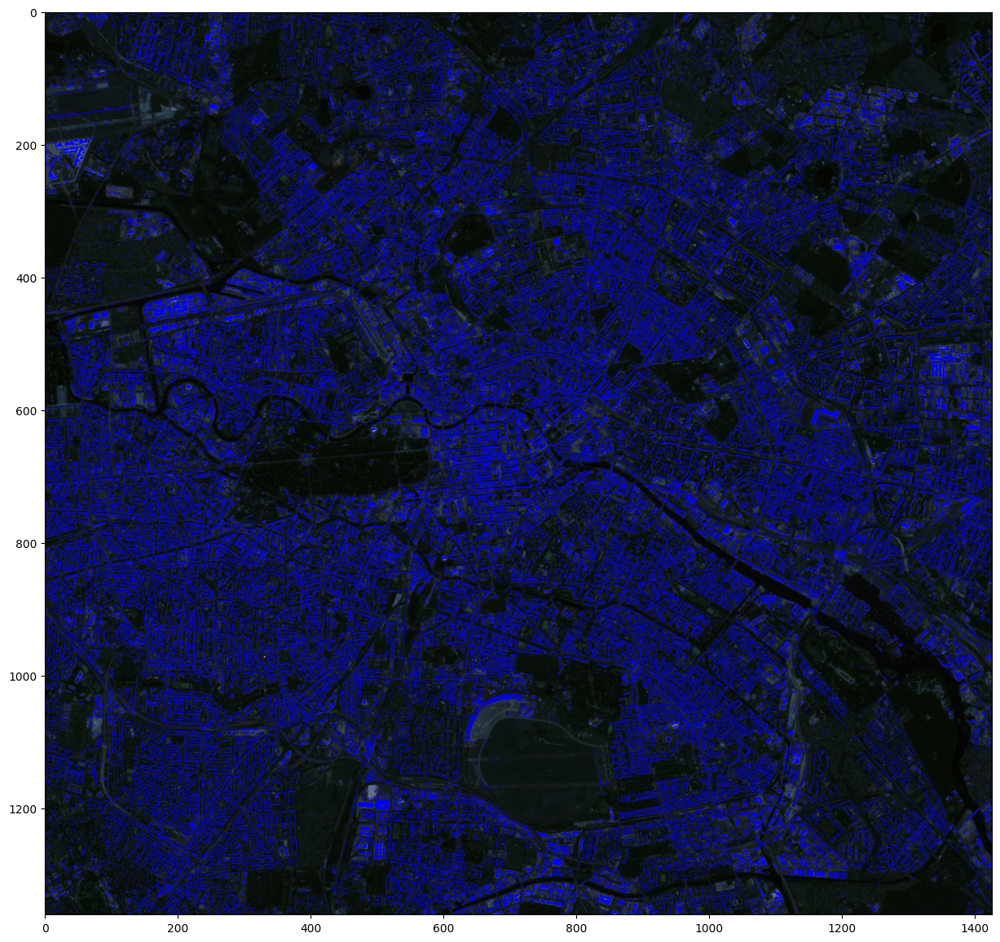

In [42]:
overlapped = test_images[:, :, :3].copy()
overlapped[predicted == 1] = [0, 0, 1]
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(overlapped)
fig.savefig("plots/test_set_prediction.pdf", bbox_inches='tight', dpi=200)

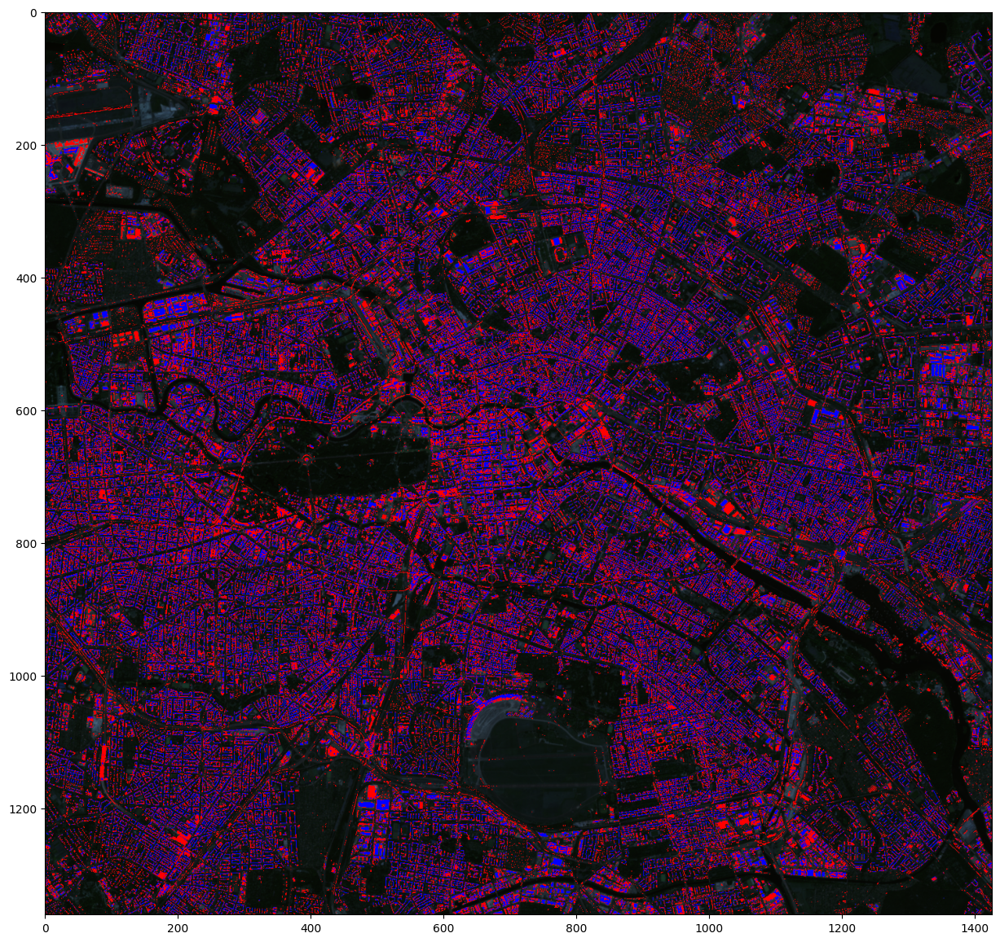

In [43]:
overlapped[tensor_errors.squeeze(0) == 1] = [1, 0, 0]
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(overlapped)
fig.savefig("plots/test_set_error.pdf", bbox_inches='tight', dpi=200)

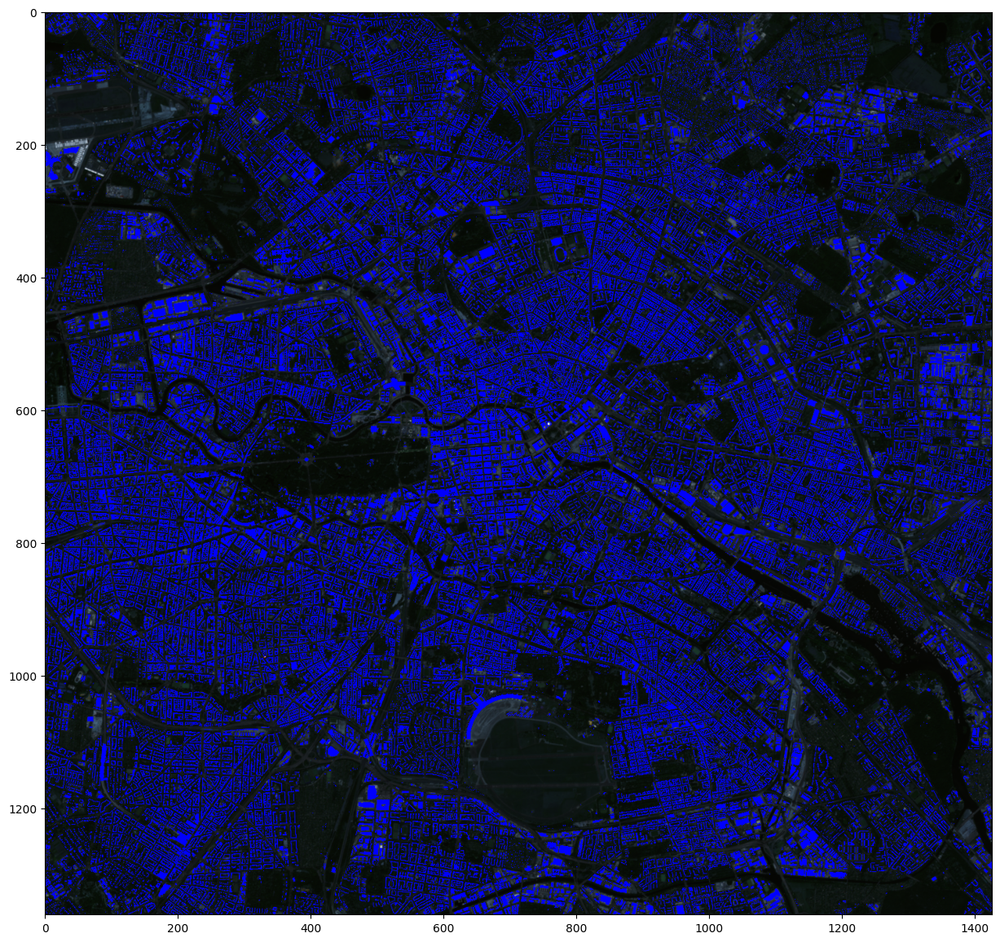

In [26]:
# ground truth
overlapped = test_images[:, :, :3].copy()
overlapped[test_labels == 1] = [0, 0, 1]
fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(overlapped)
fig.savefig("plots/test_set_ground_truth.pdf", bbox_inches='tight', dpi=200)